In [1]:
# from regelum.scenario import Scenario
from regelum.simulator import CasADi
import numpy as np

from regelum.utils import rg
from regelum.model import ModelWeightContainer
# Max Iteration count may be added in opt_options={"print_level": 0, "max_iter": MAX_ITER},
from regelum.optimizable.core.configs import CasadiOptimizerConfig
from regelum.predictor import EulerPredictor
from regelum.objective import RunningObjective
from regelum.critic import CriticTrivial
from regelum.scenario import RLScenario
from regelum.event import Event

import sys
sys.path.append('../')

from src.system import HydraulicSystem, StationaryHydraulicSystem
from src.observer import StationaryHydraulicObserver
from src.objective import HydraulicObjectiveModel
from src.policy import MPC
from src.animation import HydraylicAnimation

In [2]:
from regelum.callback import (
    ScenarioStepLogger,
    # StateTracker,
    # HistoricalDataCallback,
)
from src.callback import HistoricalDataCallback, SimulatorStepLogger

from regelum import set_ipython_env
%matplotlib inline
callbacks = [SimulatorStepLogger, ScenarioStepLogger, HistoricalDataCallback]
ScenarioStepLogger.cooldown = 0.01
callbacks = set_ipython_env(callbacks=callbacks, interactive=True)

In [3]:
MAX_STEP = 1e-7
PREDICTION_HORIZON = 5
FINAL_TIME = 10e-3
SAMPLING_TIME = 1e-3
ACTION_SIZE = 1

pred_step_size = 1 * SAMPLING_TIME

# Define the initial state
p_atm = 1e5
initial_state = rg.array([1e3, 0, 0, p_atm, p_atm])

model = ModelWeightContainer(
    dim_output=ACTION_SIZE, 
    weights_init=rg.zeros((PREDICTION_HORIZON + 1, ACTION_SIZE), rc_type=rg.CASADI)
)  # A trivial model contains our predicted actions

# system = HydraulicSystem(
#     init_state=initial_state
# )

# # Update observation noize std
# system.update_system_parameters(
#     {
#         "jet_length_std": 2e-1, # Was 10e-2
#         "jet_velocity_std": 1e-1, # Was 2e-2
#     }
# )

system = HydraulicSystem(
    init_state=initial_state,
    system_parameters_init = {
            "p_l_gauge": 1.5e5,
            "x_th_limits": (0., 20.),
            "freq_th": 500.0,
            "m_p": 20e-3,
            "D_th": 200e-6, # WAS 200e-6, then 5e-3
            "D_hydr": 20e-3,
            "D_work": 20e-3,
            "h_work_init": 1e3,
            "D_exit": 0.33e-3,
            "l_exit": 8.5e-3,
            "p_coulomb": 10e3, # WAS 10e3, then 1e3
            "eta": 0.70,
            "zeta_th": 5.0, # WAS 5.0, then 0.1
            "rho_hydr": 1e3,
            "rho_work": 1e3,
            "beta_v_hydr": 0.49e-9,
            "beta_v_work": 0.49e-9,
            "sigma_work": 73e-3,
            "mu_work": 1.0e-3,
            "v_j": 200.,
            "jet_length_std": 1e-1, # Was 10e-2
            "jet_velocity_std": 10, # Was 2e-2
            "pressure_std": 0.,
            "p_atm": 1e5, # Atmosphere (ambient) pressure, Pa
            "g": 9.81, # gravity constant, m/s^2
        },
)


system_model = StationaryHydraulicSystem(
    init_state=initial_state
)
observer = StationaryHydraulicObserver(
    system=system_model
)
predictor = EulerPredictor(
    system=system_model, pred_step_size=pred_step_size
)  # Predictor is used for MPC-prediction

# RUNNING OBJECTIVE
running_objective_model = HydraulicObjectiveModel(
    system=system_model,
    quad_matrix_type="diagonal", weights=[1, 0, 0]
)  # A quadratic model for running (a.k.a. instant) objective
running_objective = RunningObjective(
    model=running_objective_model
)  # Wrap `running_objective_model` into `RunningObjective` class

# Update observation noize std
system.update_system_parameters(
    {
        "jet_length_std": 1e-1, # Was 10e-2
        "jet_velocity_std": 10, # Was 2e-2
    }
)

system_model.update_system_parameters(
    {
        "jet_length_std": 1e-1, # Was 10e-2
        "jet_velocity_std": 10, # Was 2e-2
    }
)

simulator = CasADi(
    system=system,
    state_init=initial_state,
    action_init=rg.array([0]),
    time_final=FINAL_TIME,
    max_step=MAX_STEP,
)

scenario = RLScenario(
    policy=MPC(
        model=model,
        system=system_model,
        action_bounds=system_model.action_bounds,
        optimizer_config=CasadiOptimizerConfig(),
        prediction_horizon=PREDICTION_HORIZON,
        running_objective=running_objective,
        predictor=predictor
    ),
    observer = observer,
    critic=CriticTrivial(),  # mocked critic
    running_objective=running_objective,
    policy_optimization_event=Event.compute_action,  # run policy optimization on each step
    discount_factor=1.0,
    sampling_time=SAMPLING_TIME,
    simulator=simulator,
    N_episodes=1,
    N_iterations=1,
)

scenario.run()


******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************



[13:10:46] INFO     runn. objective: 3.85, state est.: [999.99   1.43   0.1 ], observation: [-0.03 ]8;id=788888;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=814337;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    5.24], action: [20.], value: 0.0038, time: 0.0000 (0.0%), episode: 1/1,                        
                    iteration: 1/1                                                                                 

[13:10:52] INFO     runn. objective: 3.56, state est.: [1000.01  115.36    7.7 ], observation: [   ]8;id=115645;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=958628;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    0.04 423.71], action: [20.], value: 0.0074, time: 0.0010 (10.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

[13:11:00] INFO     runn. objective: 1.05, state est.: [1000.25  182.4    12.19], observation: [   ]8;id=719658;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=850337;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    0.9  669.98], action: [0.69], value: 0.0085, time: 0.0020 (20.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[13:11:08] INFO     runn. objective: 0.33, state est.: [1000.37  118.55    7.91], observation: [   ]8;id=775098;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=328492;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.35 435.44], action: [-2.79], value: 0.0088, time: 0.0030 (30.0%), episode:                   
                    1/1, iteration: 1/1                                                                            

[13:11:19] INFO     runn. objective: 0.04, state est.: [1000.47   56.8     3.79], observation: [   ]8;id=366317;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=721595;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.74 208.63], action: [-4.19], value: 0.0088, time: 0.0040 (40.0%), episode:                   
                    1/1, iteration: 1/1                                                                            

[13:11:31] INFO     runn. objective: 0.08, state est.: [1000.45   11.66    0.78], observation: [   ]8;id=851505;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=111310;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.64 42.82], action: [8.2], value: 0.0089, time: 0.0050 (50.0%), episode: 1/1,                 
                    iteration: 1/1                                                                                 

[13:11:44] INFO     runn. objective: 0.02, state est.: [1000.49   49.88    3.33], observation: [   ]8;id=193102;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=944462;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.79 183.23], action: [-4.], value: 0.0089, time: 0.0060 (60.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

[13:11:59] INFO     runn. objective: 0.01, state est.: [1000.54    9.35    0.62], observation: [   ]8;id=422576;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=839860;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    2.   34.33], action: [-2.85], value: 0.0089, time: 0.0070 (70.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[13:12:15] INFO     runn. objective: 0.01, state est.: [1000.56   -0.29   -0.02], observation: [   ]8;id=454298;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=532160;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    2.05 -1.07], action: [-0.], value: 0.0089, time: 0.0080 (80.0%), episode: 1/1,                 
                    iteration: 1/1                                                                                 

[13:12:34] INFO     runn. objective: 0.00, state est.: [1000.51   -3.44   -0.21], observation: [   ]8;id=729783;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=855443;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.86 -12.62], action: [0.], value: 0.0089, time: 0.0090 (90.0%), episode: 1/1,                 
                    iteration: 1/1                                                                                 

[13:12:55] INFO     runn. objective: 0.07, state est.: [1000.6    -2.95   -0.18], observation: [   ]8;id=923481;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=291848;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    2.19 -10.85], action: [-0.], value: 0.0090, time: 0.0100 (100.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

,time,running_objective,current_value,episode_id,iteration_id,throttle action [µm],jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm]
0,0.000000,3.846362,0.003846,1,1,20.000000,-0.034911,5.238279,999.990495,1.426121,0.095075
1,0.001000,3.559112,0.007405,1,1,20.000000,0.039742,423.711636,1000.010820,115.355493,7.697026
2,0.002000,1.049417,0.008455,1,1,0.687407,0.901893,669.975041,1000.245540,182.400705,12.186397
3,0.003000,0.332203,0.008787,1,1,-2.794080,1.349933,435.437802,1000.367519,118.547942,7.910424
4,0.004000,0.035394,0.008822,1,1,-4.192600,1.738169,208.628159,1000.473217,56.799016,3.787400
5,0.005000,0.084177,0.008907,1,1,8.203169,1.636170,42.815693,1000.445447,11.656572,0.777113
6,0.006000,0.017790,0.008924,1,1,-3.999143,1.792924,183.226167,1000.488123,49.883324,3.326097
7,0.007000,0.005034,0.008929,1,1,-2.847644,1.997254,34.330327,1000.543753,9.346431,0.623100
8,0.008000,0.014901,0.008944,1,1,-0.000483,2.048374,-1.066514,1000.557670,-0.290359,-0.018112
9,0.009000,0.003900,0.008948,1,1,0.000247,1.863854,-12.621636,1000.507434,-3.436240,-0.214347


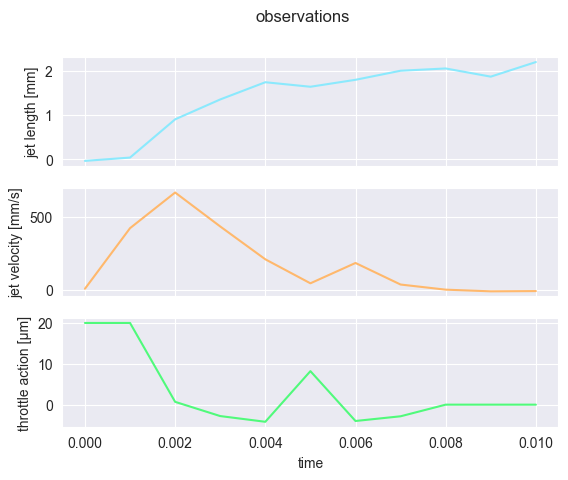

In [4]:
display(callbacks[-1].data)
callbacks[-1].plot(name="observations");

In [5]:
display(callbacks[0].data)

,time,jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm],hydraulic pressure [Pa],working pressure [Pa]
0,0.000000e+00,0.000000,0.000000,1000.000000,0.000000,0.000000,100000.000000,100000.000000
1,1.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.001000,100000.001581,100000.000000
2,2.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.002000,100000.006323,100000.000000
3,3.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.003000,100000.014227,100000.000000
4,4.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.004000,100000.025291,100000.000000
...,...,...,...,...,...,...,...,...
99997,9.999700e-03,2.011777,0.893381,1000.547706,0.243223,-0.873984,107816.512068,100000.000220
99998,9.999800e-03,2.011777,2.476276,1000.547706,0.674166,-0.873984,107816.474576,100000.001023
99999,9.999900e-03,2.011777,0.212476,1000.547706,0.057846,-0.873984,107816.426620,100000.000514
100000,1.000000e-02,2.011777,0.833182,1000.547706,0.226834,-0.873984,107816.357536,100000.002464


## Display data and animation

In [6]:
state_trajectory = callbacks[0].data
observations = callbacks[-1].data
display(observations)
# callbacks[-1].plot(name="observations"); # Replace plot to own plot function!

# Clean callback
callbacks[0].reset()
callbacks[-1].clear_recent_data()

,time,running_objective,current_value,episode_id,iteration_id,throttle action [µm],jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm]
0,0.000000,3.846362,0.003846,1,1,20.000000,-0.034911,5.238279,999.990495,1.426121,0.095075
1,0.001000,3.559112,0.007405,1,1,20.000000,0.039742,423.711636,1000.010820,115.355493,7.697026
2,0.002000,1.049417,0.008455,1,1,0.687407,0.901893,669.975041,1000.245540,182.400705,12.186397
3,0.003000,0.332203,0.008787,1,1,-2.794080,1.349933,435.437802,1000.367519,118.547942,7.910424
4,0.004000,0.035394,0.008822,1,1,-4.192600,1.738169,208.628159,1000.473217,56.799016,3.787400
5,0.005000,0.084177,0.008907,1,1,8.203169,1.636170,42.815693,1000.445447,11.656572,0.777113
6,0.006000,0.017790,0.008924,1,1,-3.999143,1.792924,183.226167,1000.488123,49.883324,3.326097
7,0.007000,0.005034,0.008929,1,1,-2.847644,1.997254,34.330327,1000.543753,9.346431,0.623100
8,0.008000,0.014901,0.008944,1,1,-0.000483,2.048374,-1.066514,1000.557670,-0.290359,-0.018112
9,0.009000,0.003900,0.008948,1,1,0.000247,1.863854,-12.621636,1000.507434,-3.436240,-0.214347


In [7]:
l_crit = system._parameters["l_crit"]
D_drop = system._parameters["D_drop"]
D_exit = system._parameters["D_exit"]*1e3
D_drop_rel = D_drop/D_exit

anim_cl = HydraylicAnimation(
    state_trajectory, 
    observations, 
    l_crit, 
    D_drop_rel
)
anim_cl.animate_system(interacitve=True)

           INFO     Animation.save using <class 'matplotlib.animation.HTMLWriter'>                ]8;id=329564;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/matplotlib/animation.py\animation.py]8;;\:]8;id=150357;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/matplotlib/animation.py#1060\1060]8;;\

Once 
 
 Loop 
 
 Reflect

Save results

In [8]:
anim_cl = HydraylicAnimation(
    state_trajectory, 
    observations, 
    l_crit, 
    D_drop_rel
)
# save animation
anim_cl.animate_system(save_gif=True, gif_filename = '../results/system_animation_mpc_noize.gif')
# save last frame
anim_cl.save_last_frame('../results/system_last_observation_mpc_noize.pdf')

[13:13:22] INFO     Animation.save using <class 'matplotlib.animation.PillowWriter'>              ]8;id=838303;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/matplotlib/animation.py\animation.py]8;;\:]8;id=614046;file:///Users/vulf/.pyenv/versions/3.11.8/envs/acm-env/lib/python3.11/site-packages/matplotlib/animation.py#1060\1060]8;;\